# Analyze Region 19 - Antarctic and Subantarctic

This notebook analyzes the largest glaciers in Region 19 - Antarctic and Subantarctic

Made the decision to break up this regain into the Antartic Mainland and the Subanartic Islands. RGI contains the subantarctic islands and GLIMS contains the Antartic mainland using the outlines from Huber et al.

Huber, J., Cook, A. J., Paul, F., and Zemp, M.: A complete glacier inventory of the Antarctic Peninsula based on Landsat 7 images from 2000 to 2002 and other preexisting data sets, Earth Syst. Sci. Data, 9, 115–131, https://doi.org/10.5194/essd-9-115-2017, 2017

si = subantarctic islands

ml = mainland

In [1]:
import os
import os.path as op
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import geopandas as gpd
from shapely.geometry import Polygon
import rasterio as rio
from rasterio.plot import plotting_extent
from earthpy import clip as cl
import earthpy.plot as ep

# set working dir
HOME = op.join(op.expanduser("~"))
os.chdir(os.path.join(HOME, "git/wgms-glacier-project"))

# Set up path to load scripts
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
import scripts.wgms_scripts as ws

# Set Up Region Info

In [2]:
# Set region number, region name, and region index
# Once these are set, this notebook should run automatically for the specified region
region_number = "19"
region_name = "Antarctic and Subantarctic"

# The variable primeclass needs to be updated with the primary class of the ice complexes for the region
# This may need to be a list in some instances
# 2: icefield, 3: ice cap, 4: outlet glacier, 5: valley glacier, 6: mountain glacier
primeclass = 4 # This seems correct since these glaciers our outlets of the Antartic Ice Sheet

# Note for the region index, region_index_1 should be one less than the region number and 
# region_index_2 should be equal to the region number. For example, for region 1, index_1 should be set to 0 and 
# index_2 should be set to 1, etc.
region_index_1 = 18
region_index_2 = 19

# Ice cap/icefield epsg code used for calculating area
ic_epsg = '102020'

# Show Region

In [3]:
# Open natural earth basemap TIF file
ne_fp = 'data/natural-earth/NE1_HR_LC_SR_W/NE1_HR_LC_SR_W.tif' # 10 m res
with rio.open(ne_fp) as ne_src:
    # Convert / read the data into a numpy array:
    ne_raster = ne_src.read()
    ne_src_extent = plotting_extent(ne_src)
    bounds = ne_src.bounds
    ne_raster_meta = ne_src.meta

In [4]:
# Open glacier regions
glacier_regions_fp = "data/gtn-g-glacier-regions/cleaned/GTN-G_glacier_regions_201707_cleaned.shp"
glacier_regions = gpd.read_file(glacier_regions_fp)

# Extract Region outline
region_outline = glacier_regions[region_index_1:region_index_2]

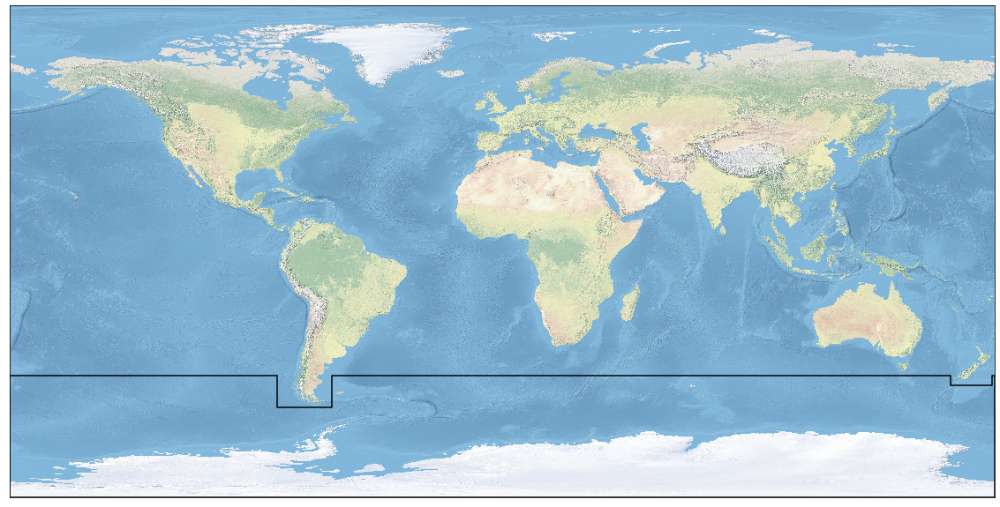

In [5]:
# Plot region outline over the natural earth
# Plot natural earth basemap
fig, ax = plt.subplots(figsize=(20, 20))

# Plot natural earth
ep.plot_rgb(ne_raster,
            rgb=[0, 1, 2],
            extent=ne_src_extent,
            ax=ax)

# Plot region outline
region_outline.boundary.plot(ax=ax, color="black")

plt.show()

In [6]:
region_outline.bounds

,minx,miny,maxx,maxy
18,-180.0,-90.0,180.0,-45.5


# Glaciers

## Open GLIMS 3 Largest Glaciers Data

In [7]:
# Open GLIMS three largest glacier outlines for this region.
glims_glaciers_fn = "data/glims/processed/largest/glims_region_" + region_number + "_huber_largest.shp"
glims_glaciers_df = gpd.read_file(glims_glaciers_fn)

In [8]:
# Check if GLIMS glacier names are of the "NoneType" because can't print legends and such if they are
# If they are, set them to a string "NONE"
glims_df_len = len(glims_glaciers_df)
for x in range(glims_df_len):
    if glims_glaciers_df['glac_name'][x] == None:
        print("GLIMS glacier " + str(x) + " equals none")
        glims_glaciers_df.loc[x, 'glac_name'] = 'NONE'

In [9]:
glims_glaciers_df

,region_no,glac_id,area,db_area,width,length,primeclass,min_elev,mean_elev,max_elev,src_date,glac_name,geometry
0,19,G294015E69537S,7018.37,7018.32,0.0,0.0,4.0,4.0,1358.0,3139.0,2002-12-31T00:00:00,Seller Glacier,"POLYGON Z ((-65.065175 -69.48543600000001 0, -..."
1,19,G294357E68789S,3499.44,3499.43,0.0,0.0,4.0,44.0,1081.0,2006.0,2002-12-31T00:00:00,Mercator Ice Piedmont,"POLYGON Z ((-65.083966 -68.65472800000001 0, -..."
2,19,G291496E67190S,2197.84,2197.83,0.0,0.0,3.0,3.0,235.0,469.0,2002-12-31T00:00:00,Fuchs Ice Piedmont,"POLYGON Z ((-68.914203 -67.761109 0, -68.91395..."
3,19,G296693E69777S,2155.42,2155.43,0.0,0.0,4.0,7.0,1330.0,3172.0,2002-12-31T00:00:00,Anthony Glacier,"POLYGON Z ((-63.772834 -69.595417 0, -63.77214..."
4,19,G295668E69137S,1816.53,1816.52,0.0,0.0,4.0,43.0,1225.0,2127.0,2002-12-31T00:00:00,Casey Glacier,"POLYGON Z ((-63.674779 -69.032264 0, -63.67511..."


## Open RGI 3 Largest Glaciers Data

In [10]:
# Open RGI three largest glacier outlines for this region.
rgi_glaciers_fn = "data/rgi/processed/largest/rgi_region_" + region_number + "_largest.shp"
rgi_glaciers_df = gpd.read_file(rgi_glaciers_fn)

In [11]:
# Check if RGI glacier names are of the "NoneType" because can't print legends and such if they are
# If they are, set them to a string "NONE"
rgi_df_len = len(rgi_glaciers_df)
for x in range(rgi_df_len):
    if rgi_glaciers_df['Name'][x] == None:
        print("RGI glacier " + str(x) + " equals none")
        rgi_glaciers_df.loc[x, 'Name'] = 'NONE'

RGI glacier 2 equals none
RGI glacier 3 equals none
RGI glacier 4 equals none


In [12]:
rgi_glaciers_df

,RGIId,GLIMSId,BgnDate,EndDate,CenLon,CenLat,O1Region,O2Region,Area,Zmin,...,Aspect,Lmax,Status,Connect,Form,TermType,Surging,Linkages,Name,geometry
0,RGI60-19.01721,G238773E74044S,-9999999,-9999999,-121.2270,-74.0437,19,16,6004.845,10,...,156,39017,0,0,0,5,9,9,Carney Island IC,"POLYGON ((-123.196889617 -73.88773663899997, -..."
1,RGI60-19.00423,G260838E72287S,19721204,19730130,-99.1619,-72.2868,19,18,5260.723,10,...,95,33233,0,0,0,5,9,9,Thurston I 001,"POLYGON ((-100.71160608 -71.95814650899996, -1..."
2,RGI60-19.00124,G289107E72447S,19970901,20011220,-70.8931,-72.4474,19,19,4766.142,10,...,122,60563,0,0,0,5,9,9,NONE,POLYGON ((-69.10762573799997 -72.1447113459999...
3,RGI60-19.00134,G288531E71248S,19970901,20000215,-71.4686,-71.2482,19,19,3980.427,10,...,242,54549,0,0,0,5,9,9,NONE,POLYGON ((-70.62503227599996 -70.9788515899999...
4,RGI60-19.00156,G290150E71851S,19970901,-9999999,-69.8497,-71.8512,19,19,3533.646,50,...,137,105892,0,0,1,5,9,9,NONE,POLYGON ((-70.31912156899995 -71.3438353009999...


## Plot GLIMS Glaciers

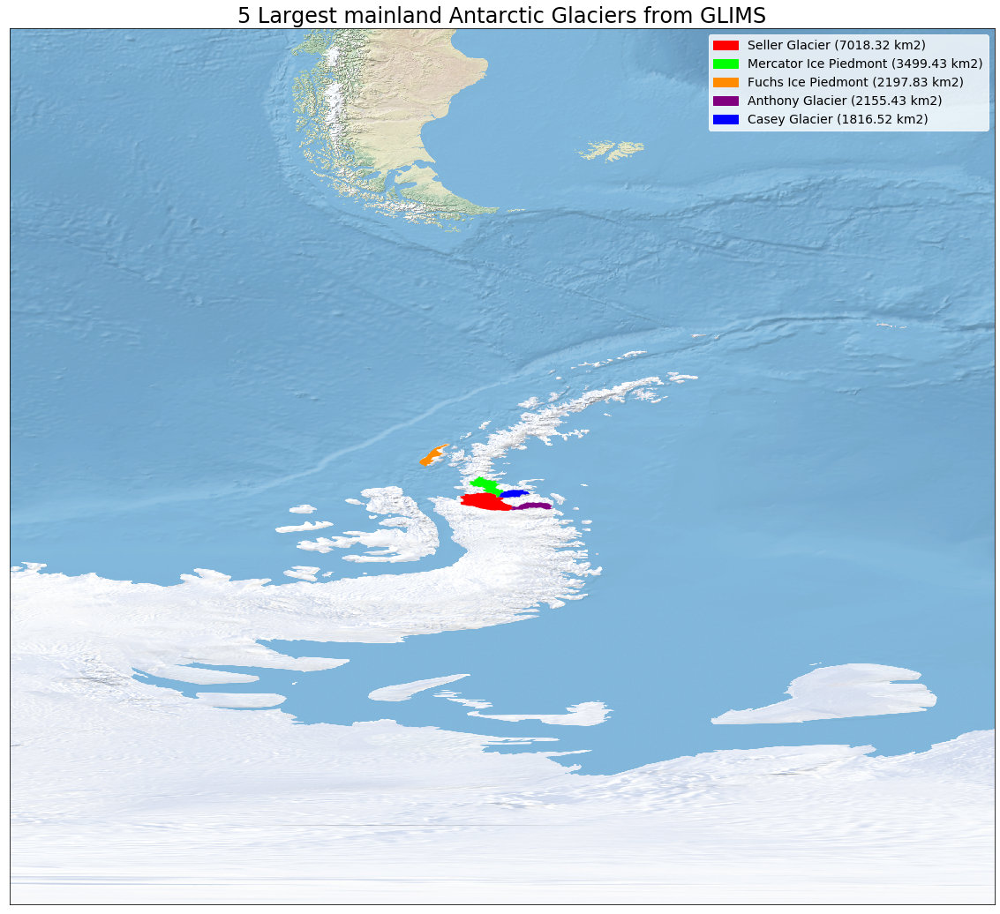

In [13]:
# Plot 3 largest glaciers on natural earth from GLIMS
legend_colors = ['red', 'lime', 'darkorange', 'purple', 'blue']
legend_labels = [glims_glaciers_df['glac_name'][0] + ' (' + str(glims_glaciers_df['db_area'][0]) + ' km2)',
                 glims_glaciers_df['glac_name'][1] + ' (' + str(glims_glaciers_df['db_area'][1]) + ' km2)',
                 glims_glaciers_df['glac_name'][2] + ' (' + str(glims_glaciers_df['db_area'][2]) + ' km2)',
                 glims_glaciers_df['glac_name'][3] + ' (' + str(glims_glaciers_df['db_area'][3]) + ' km2)',
                 glims_glaciers_df['glac_name'][4] + ' (' + str(glims_glaciers_df['db_area'][4]) + ' km2)']
legend_patches = [Patch(color=icolor, label=label)
                  for icolor, label in zip(legend_colors, legend_labels)]

# Set up plot space
fig, ax = plt.subplots(figsize=(20,20))
minx, miny, maxx, maxy = region_outline.total_bounds
maxx = -40
minx = -90
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

# Plot natural earth basemap
ep.plot_rgb(ne_raster,
            rgb=[0, 1, 2],
            extent=ne_src_extent,
            ax=ax)

# Plot 3 largest glaciers from glims dataframe
glims_glaciers_df.iloc[0:1].plot(ax=ax, color='red')
glims_glaciers_df.iloc[1:2].plot(ax=ax, color='lime')
glims_glaciers_df.iloc[2:3].plot(ax=ax, color='darkorange')
glims_glaciers_df.iloc[3:4].plot(ax=ax, color='purple')
glims_glaciers_df.iloc[4:5].plot(ax=ax, color='blue')
ax.set_title('5 Largest mainland Antarctic Glaciers from GLIMS', fontsize=24)
# Plot legend
ax.legend(handles=legend_patches,
         facecolor ="white",
         edgecolor = "white",
         fontsize = 14,
         bbox_to_anchor = (1.0,1.0))

plt.show()

## Plot RGI Glaciers

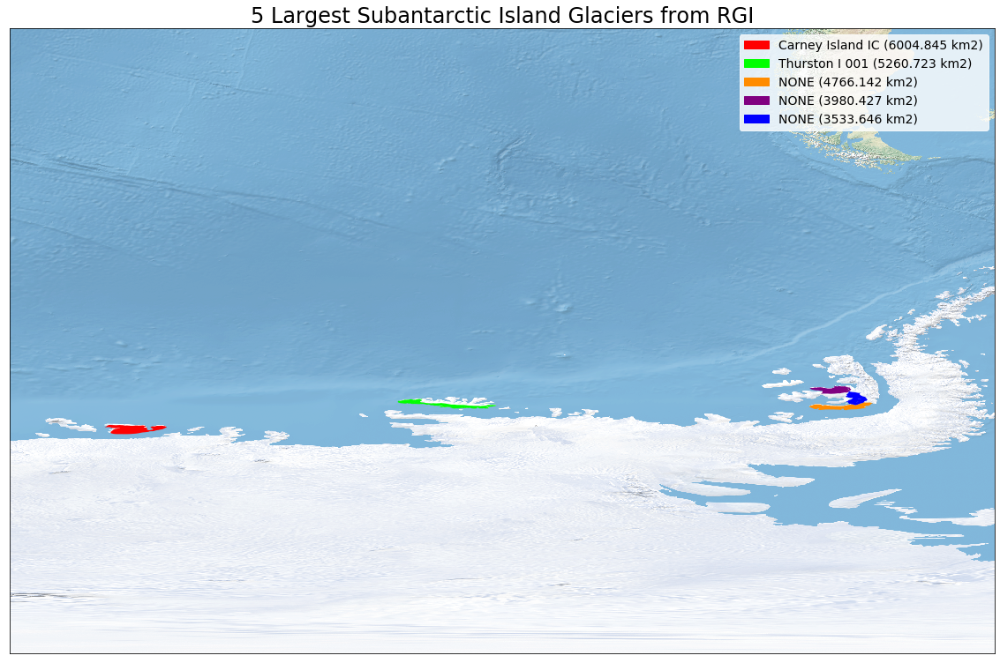

In [14]:
# Plot 3 largest glaciers on natural earth from RGI
legend_colors = ['red', 'lime', 'darkorange', 'purple', 'blue']
legend_labels = [rgi_glaciers_df['Name'][0] + ' (' + str(rgi_glaciers_df['Area'][0]) + ' km2)',
                 rgi_glaciers_df['Name'][1] + ' (' + str(rgi_glaciers_df['Area'][1]) + ' km2)',
                 rgi_glaciers_df['Name'][2] + ' (' + str(rgi_glaciers_df['Area'][2]) + ' km2)',
                 rgi_glaciers_df['Name'][3] + ' (' + str(rgi_glaciers_df['Area'][3]) + ' km2)',
                 rgi_glaciers_df['Name'][4] + ' (' + str(rgi_glaciers_df['Area'][4]) + ' km2)']
legend_patches = [Patch(color=icolor, label=label)
                  for icolor, label in zip(legend_colors, legend_labels)]

# Set up plot space
fig, ax = plt.subplots(figsize=(20,20))
minx, miny, maxx, maxy = region_outline.total_bounds
maxx = -60
minx = -130
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

# Plot natural earth basemap
ep.plot_rgb(ne_raster,
            rgb=[0, 1, 2],
            extent=ne_src_extent,
            ax=ax)

# Plot 3 largest glaciers from rgi dataframe
rgi_glaciers_df.iloc[0:1].plot(ax=ax, color='red')
rgi_glaciers_df.iloc[1:2].plot(ax=ax, color='lime')
rgi_glaciers_df.iloc[2:3].plot(ax=ax, color='darkorange')
rgi_glaciers_df.iloc[3:4].plot(ax=ax, color='purple')
rgi_glaciers_df.iloc[4:5].plot(ax=ax, color='blue')
ax.set_title('5 Largest Subantarctic Island Glaciers from RGI', fontsize=24)
# Plot legend
ax.legend(handles=legend_patches,
         facecolor ="white",
         edgecolor = "white",
         fontsize = 14,
         bbox_to_anchor = (1.0,1.0))

plt.show()

## Antarctic Mainland Glaciers
Use GLIMS for these. The three largest are (excluding Fuchs Ice Piedmont because it is part of the subanarctic islands).
1. Seller Glacier 7018.32
1. Mercator Ice Piedmont 3499.43 (need to check with Michael if I should exclude this because it is an ice piedmont)
1. Anthony Glacier 2155.43

## Create final shapefiles
This section creates and formats the final dataframe, plots it to make sure it looks ok, and saves it to a shapefile.


### Create final dataframe

In [15]:
# Set up the final dataframe that will be used when saving the final shapefiles
# Drop columns that are not needed for the final data (use GLIMS dataframe for this)
final_data_ml_df = glims_glaciers_df.drop(['area', 'width', 'length', 
                                        'min_elev', 'mean_elev', 'max_elev'], axis=1)

# Add region_name column
final_data_ml_df['reg_name'] = region_name

# Add primary class (primeclass) column. 
final_data_ml_df['primeclass'] = primeclass

# Rename some columns
final_data_ml_df.rename(columns={'glac_id': 'glims_id', 'db_area': 'area_km2', 
                                       'src_date': 'date'}, inplace=True)

# Drop row 3 because it is not on the Antarctic peninsula and drop row 5 because it isn't in the top 3 and reset index
final_data_ml_df.drop([2, 4], inplace = True)
final_data_ml_df.reset_index(drop=True, inplace=True)

# Add RGI ID column
final_data_ml_df['rgi_id'] = 'N/A'

# Add area_src column that gets filled lower down
final_data_ml_df['area_src'] = 'G'

# Reorder the columns of the dataframe
final_data_ml_df = final_data_ml_df[['region_no', 'reg_name', 'glac_name', 'glims_id', 'rgi_id', 
                                     'primeclass', 'area_km2', 'area_src', 'date', 'geometry']]

In [16]:
final_data_ml_df

,region_no,reg_name,glac_name,glims_id,rgi_id,primeclass,area_km2,area_src,date,geometry
0,19,Antarctic and Subantarctic,Seller Glacier,G294015E69537S,N/A,4,7018.32,G,2002-12-31T00:00:00,"POLYGON Z ((-65.065175 -69.48543600000001 0, -..."
1,19,Antarctic and Subantarctic,Mercator Ice Piedmont,G294357E68789S,N/A,4,3499.43,G,2002-12-31T00:00:00,"POLYGON Z ((-65.083966 -68.65472800000001 0, -..."
2,19,Antarctic and Subantarctic,Anthony Glacier,G296693E69777S,N/A,4,2155.43,G,2002-12-31T00:00:00,"POLYGON Z ((-63.772834 -69.595417 0, -63.77214..."


In [17]:
# Clean the date format in the final dataframe
final_data_ml_df['date'] = final_data_ml_df['date'].str[:10]

In [18]:
final_data_ml_df

,region_no,reg_name,glac_name,glims_id,rgi_id,primeclass,area_km2,area_src,date,geometry
0,19,Antarctic and Subantarctic,Seller Glacier,G294015E69537S,N/A,4,7018.32,G,2002-12-31,"POLYGON Z ((-65.065175 -69.48543600000001 0, -..."
1,19,Antarctic and Subantarctic,Mercator Ice Piedmont,G294357E68789S,N/A,4,3499.43,G,2002-12-31,"POLYGON Z ((-65.083966 -68.65472800000001 0, -..."
2,19,Antarctic and Subantarctic,Anthony Glacier,G296693E69777S,N/A,4,2155.43,G,2002-12-31,"POLYGON Z ((-63.772834 -69.595417 0, -63.77214..."


### Plot final dataframe to check accuracy

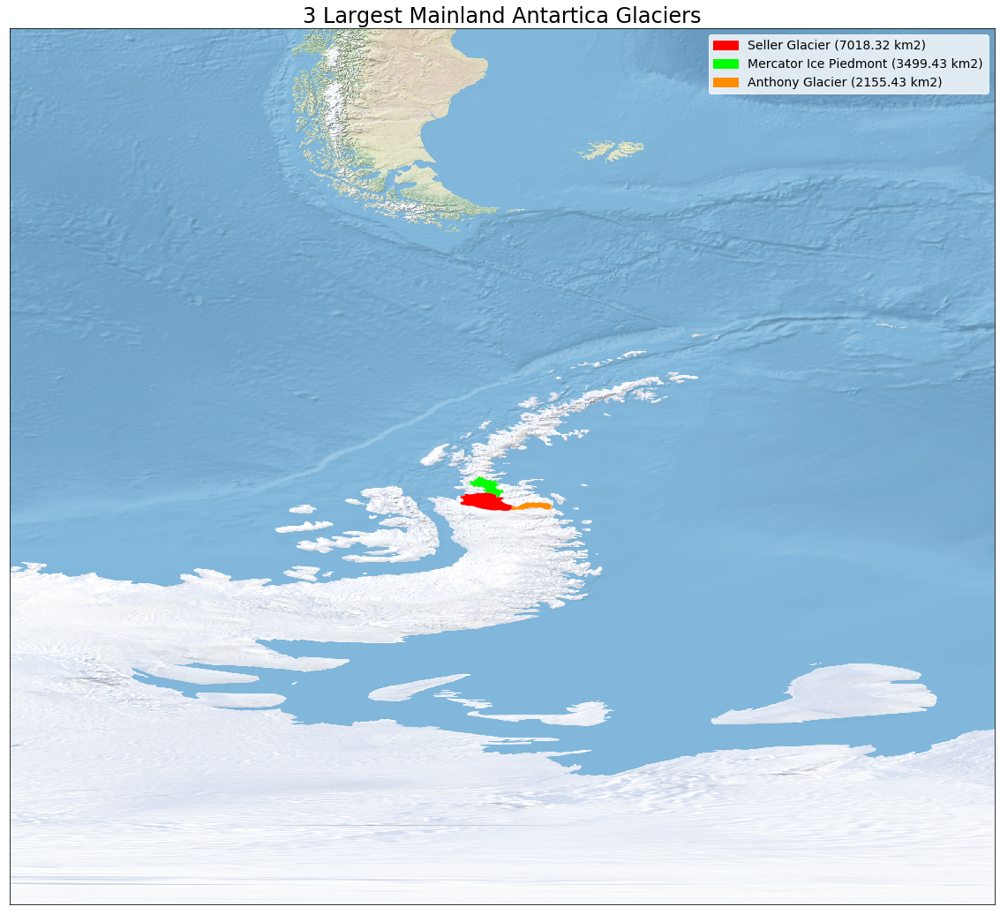

In [19]:
# Check that the geodataframe wasn't corrupted from these changes by plotting the data
# Plot 3 largest glaciers on natural earth from GLIMS
# Set up legend. Note that the sizes come from an average of GLIMS and RGI. 
# See wgms-glacier-project/data/comparison/compare-glims-rgi.xlsx
legend_colors = ['red', 'lime', 'darkorange']
legend_labels = [final_data_ml_df['glac_name'][0] + ' (' + str(round(final_data_ml_df['area_km2'][0], 2)) + ' km2)',
                 final_data_ml_df['glac_name'][1] + ' (' + str(round(final_data_ml_df['area_km2'][1], 2)) + ' km2)',
                 final_data_ml_df['glac_name'][2] + ' (' + str(round(final_data_ml_df['area_km2'][2], 2)) + ' km2)']
legend_patches = [Patch(color=icolor, label=label)
                  for icolor, label in zip(legend_colors, legend_labels)]

# Set up plot space
fig, ax = plt.subplots(figsize=(20,20))
minx, miny, maxx, maxy = region_outline.total_bounds
maxx = -40
minx = -90
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

# Plot natural earth basemap
ep.plot_rgb(ne_raster,
            rgb=[0, 1, 2],
            extent=ne_src_extent,
            ax=ax)

# Plot 3 largest glaciers from glims dataframe
final_data_ml_df.iloc[0:1].plot(ax=ax, color='red')
final_data_ml_df.iloc[1:2].plot(ax=ax, color='lime')
final_data_ml_df.iloc[2:3].plot(ax=ax, color='darkorange')
ax.set_title('3 Largest Mainland Antartica Glaciers', fontsize=24)
# Plot legend
ax.legend(handles=legend_patches,
         facecolor ="white",
         edgecolor = "white",
         fontsize = 14,
         bbox_to_anchor = (1.0,1.0))

plt.show()

### Create shapefile from the final dataframe

In [20]:
# Write dataframe to shapefile and save to zip if it doesn't already exist
zipfile_ml_fn = "data/final-dataset/region-" + region_number + "-mainland-largest-glaciers.zip"
if os.path.exists(zipfile_ml_fn) == False:
    # Create the shapefile
    final_data_ml_fn = "data/final-dataset/region-" + region_number + "-mainland-largest-glaciers.shp"
    final_data_ml_df.to_file(driver='ESRI Shapefile', filename=final_data_ml_fn)
    
    # Zip up the shapefile
    zipfile_ml_fn = ws.zipshp(final_data_ml_fn, Delete=True)
    print("Creating zipfile: " + zipfile_ml_fn)
else:
    print(zipfile_ml_fn + " already extists")

data/final-dataset/region-19-mainland-largest-glaciers.zip already extists


## Subantartic Islands Glaciers
Use RGI for these. 

The first one in RGi is an ice (Carney Island Ice Cap).

The second is a glacier (Thurston Island 001 Glacier).

The third is an ice cap according to Bliss, Hock, and Cogley (2013).

The fourth is a glacier on Alexander Island according to Bliss, Hock, and Cogley (2013).

The fifth is a glacier on Alexander Island Bliss, Hock, and Cogley (2013).

The 3 largest are the following:

1. Thurston Island Glacier 001 5260.723 km2
1. Unnamed Glacier on Alexander Island 3980.4 km2
1. Unnamed Glacier on Alexander Island 3533.6 km2

## Create final shapefiles
This section creates and formats the final dataframe, plots it to make sure it looks ok, and saves it to a shapefile.

### Create final dataframe

In [21]:
# Set up the final dataframe that will be used when saving the final shapefiles
# Drop columns that are not needed for the final data (use RGI dataframe for this)
final_data_si_df = rgi_glaciers_df.drop(['CenLon', 'CenLat', 'O2Region', 'EndDate',
                                        'Zmin', 'Zmax', 'Zmed', 'Slope', 'Aspect', 'Lmax', 'Status',
                                         'Connect', 'Form', 'TermType', 'Surging', 'Linkages'], axis=1)

# Add region_name column
final_data_si_df['reg_name'] = region_name

# Add primary class (primeclass) column. 
final_data_si_df['primeclass'] = primeclass

# Rename some columns
final_data_si_df.rename(columns={'O1Region': 'region_no', 'GLIMSId': 'glims_id', 'Area': 'area_km2', 
                                 'BgnDate': 'date', 'Name': 'glac_name', 'RGIId': 'rgi_id'}, inplace=True)

# Drop the 1st and the 3rd because they are ice capss and will be analyzed in the ice cap section and reset index
final_data_si_df.drop([0, 2], inplace = True)
final_data_si_df.reset_index(drop=True, inplace=True)

# Clean up glacier names
final_data_si_df.iloc[0, final_data_si_df.columns.get_loc('glac_name')] = "Thurston Island 001 Glacier"
final_data_si_df.iloc[1, final_data_si_df.columns.get_loc('glac_name')] = "Unnamed Glacier"
final_data_si_df.iloc[2, final_data_si_df.columns.get_loc('glac_name')] = "Unnamed Glacier"

# Format dates
d0 = final_data_si_df.iloc[0, final_data_si_df.columns.get_loc('date')]
d0 = '-'.join([d0[:4], d0[4:6], d0[6:]]) # add hyphens
final_data_si_df.iloc[0, final_data_si_df.columns.get_loc('date')] = d0

d1 = final_data_si_df.iloc[1, final_data_si_df.columns.get_loc('date')]
d1 = '-'.join([d1[:4], d1[4:6], d1[6:]]) # add hyphens
final_data_si_df.iloc[1, final_data_si_df.columns.get_loc('date')] = d1

d2 = final_data_si_df.iloc[2, final_data_si_df.columns.get_loc('date')]
d2 = '-'.join([d2[:4], d2[4:6], d2[6:]])
final_data_si_df.iloc[2, final_data_si_df.columns.get_loc('date')] = d2

# Add GLIMS ID column
#final_data_si_df['rgi_id'] = (rgi_glaciers_df['RGIId'][0], rgi_glaciers_df['RGIId'][1], rgi_glaciers_df['RGIId'][2])

# Add area_src column that gets filled lower down
final_data_si_df['area_src'] = 'R'

# Reorder the columns of the dataframe
final_data_si_df = final_data_si_df[['region_no', 'reg_name', 'glac_name', 'glims_id', 'rgi_id', 
                                     'primeclass', 'area_km2', 'area_src', 'date', 'geometry']]

In [22]:
final_data_si_df

,region_no,reg_name,glac_name,glims_id,rgi_id,primeclass,area_km2,area_src,date,geometry
0,19,Antarctic and Subantarctic,Thurston Island 001 Glacier,G260838E72287S,RGI60-19.00423,4,5260.723,R,1972-12-04,"POLYGON ((-100.71160608 -71.95814650899996, -1..."
1,19,Antarctic and Subantarctic,Unnamed Glacier,G288531E71248S,RGI60-19.00134,4,3980.427,R,1997-09-01,POLYGON ((-70.62503227599996 -70.9788515899999...
2,19,Antarctic and Subantarctic,Unnamed Glacier,G290150E71851S,RGI60-19.00156,4,3533.646,R,1997-09-01,POLYGON ((-70.31912156899995 -71.3438353009999...


### Plot final dataframe to check accuracy

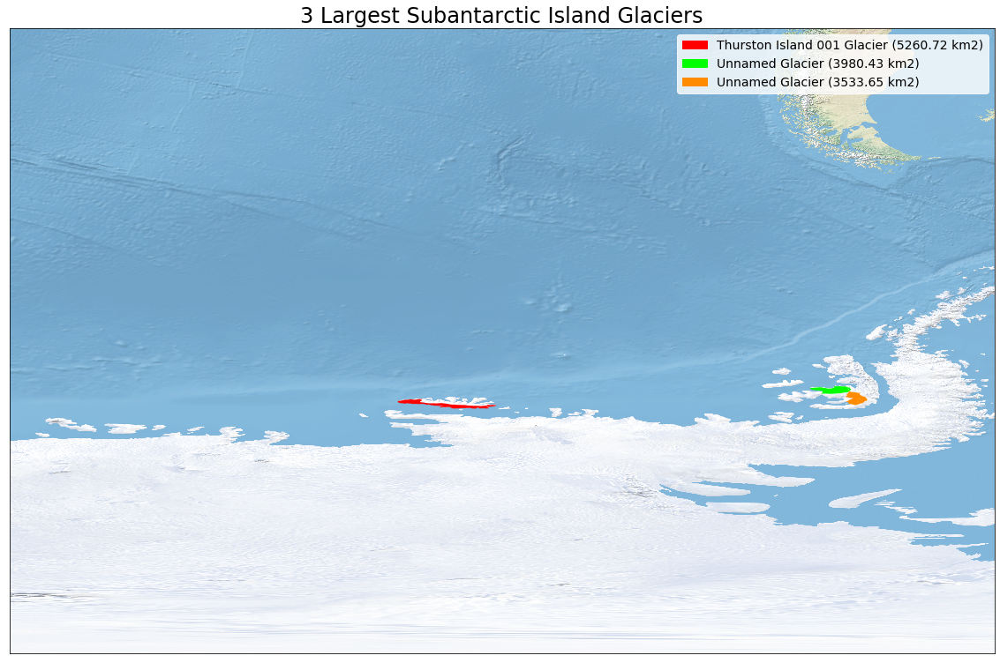

In [23]:
# Check that the geodataframe wasn't corrupted from these changes by plotting the data
# Plot 3 largest glaciers on natural earth from GLIMS
# Set up legend. Note that the sizes come from an average of GLIMS and RGI. 
# See wgms-glacier-project/data/comparison/compare-glims-rgi.xlsx
legend_colors = ['red', 'lime', 'darkorange']
legend_labels = [final_data_si_df['glac_name'][0] + ' (' + str(round(final_data_si_df['area_km2'][0], 2)) + ' km2)',
                 final_data_si_df['glac_name'][1] + ' (' + str(round(final_data_si_df['area_km2'][1], 2)) + ' km2)',
                 final_data_si_df['glac_name'][2] + ' (' + str(round(final_data_si_df['area_km2'][2], 2)) + ' km2)']
legend_patches = [Patch(color=icolor, label=label)
                  for icolor, label in zip(legend_colors, legend_labels)]

# Set up plot space
fig, ax = plt.subplots(figsize=(20,20))
minx, miny, maxx, maxy = region_outline.total_bounds
maxx = -60
minx = -130
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

# Plot natural earth basemap
ep.plot_rgb(ne_raster,
            rgb=[0, 1, 2],
            extent=ne_src_extent,
            ax=ax)

# Plot 3 largest glaciers from glims dataframe
final_data_si_df.iloc[0:1].plot(ax=ax, color='red')
final_data_si_df.iloc[1:2].plot(ax=ax, color='lime')
final_data_si_df.iloc[2:3].plot(ax=ax, color='darkorange')
ax.set_title('3 Largest Subantarctic Island Glaciers', fontsize=24)
# Plot legend
ax.legend(handles=legend_patches,
         facecolor ="white",
         edgecolor = "white",
         fontsize = 14,
         bbox_to_anchor = (1.0,1.0))

plt.show()

### Create shapefile from the final dataframe

In [24]:
# Write dataframe to shapefile and save to zip if it doesn't already exist
zipfile_si_fn = "data/final-dataset/region-" + region_number + "-islands-largest-glaciers.zip"
if os.path.exists(zipfile_si_fn) == False:
    # Create the shapefile
    final_data_si_fn = "data/final-dataset/region-" + region_number + "-islands-largest-glaciers.shp"
    final_data_si_df.to_file(driver='ESRI Shapefile', filename=final_data_si_fn)
    
    # Zip up the shapefile
    zipfile_si_fn = ws.zipshp(final_data_si_fn, Delete=True)
    print("Creating zipfile: " + zipfile_si_fn)
else:
    print(zipfile_si_fn + " already extists")

data/final-dataset/region-19-islands-largest-glaciers.zip already extists


# Ice Cap Analysis

This is done for the subantarctic islands with RGI data and the Antarctic Pensula with GLIMS Huber data.

### Subantarctic Islands Ice Caps

It looks like the top 3 subantarctic island ice caps are:

1. Alexander Island Unnamed Ice Cap
2. Thurston Island Ice Cap
3. Carney Island Ice Cap

In [25]:
# Open this regions ice caps from the exploded version
ice_caps_ex_fn = "data/rgi/processed/ice-caps/largest/largest-ice-caps-region_" + \
                  region_number + "_esri" + ic_epsg + ".shp"
ice_caps_ex_df = gpd.read_file(ice_caps_ex_fn)

In [26]:
ice_caps_ex_df

,id,area,geometry
0,692,47486.229451,POLYGON ((-68.65115005999996 -72.2207072749999...
1,276,11133.020929,POLYGON ((-96.38988303899998 -72.2732756079999...
2,357,6004.848151,"POLYGON ((-123.196889617 -73.88773663899997, -..."
3,358,5352.640398,"POLYGON ((-125.562913309 -73.82216923099998, -..."
4,655,3851.781859,POLYGON ((-68.44591053099998 -67.6656438189999...
5,272,3436.401430,POLYGON ((-73.67999627299997 -70.7925880639999...
6,278,3311.601742,POLYGON ((-77.33196091399998 -72.5741413619999...
7,377,3266.693623,POLYGON ((-74.30606199799996 -73.0582665909999...
8,102,2208.998779,POLYGON ((166.9111956850001 -77.76383506699995...
9,1571,2102.829218,POLYGON ((-36.09132669799993 -54.8809435799999...


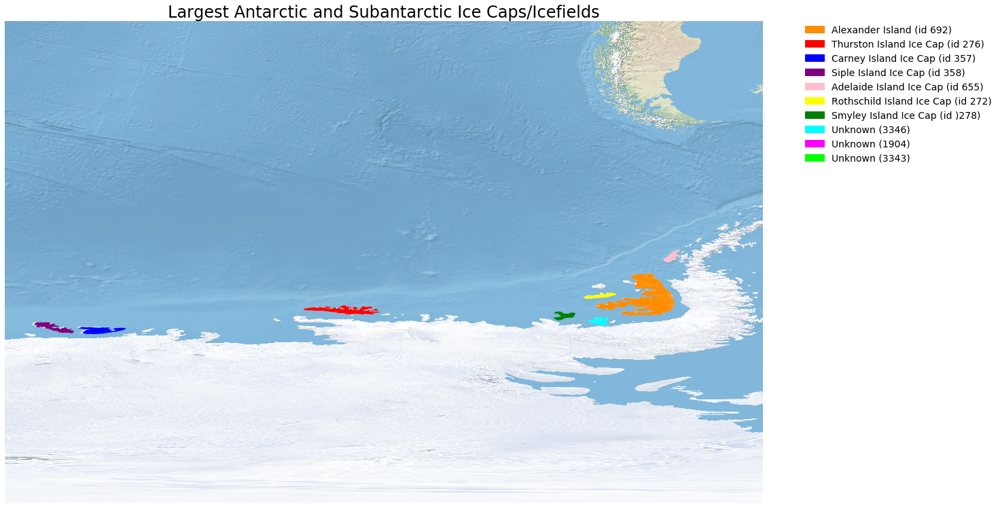

In [27]:
# Plot this regions ice caps in one frame
# Set up legend
legend_colors = ['darkorange', 'red', 'blue', 'purple', 'pink', 'yellow', 'green', 'cyan', 'magenta', 'lime']
legend_labels = ['Alexander Island (id ' + str(ice_caps_ex_df['id'][0]) + ')',
                 'Thurston Island Ice Cap (id ' + str(ice_caps_ex_df['id'][1]) + ')', 
                 'Carney Island Ice Cap (id ' + str(ice_caps_ex_df['id'][2]) + ')', 
                 'Siple Island Ice Cap (id ' + str(ice_caps_ex_df['id'][3]) + ')',
                 'Adelaide Island Ice Cap (id ' + str(ice_caps_ex_df['id'][4]) + ')',
                 'Rothschild Island Ice Cap (id ' + str(ice_caps_ex_df['id'][5]) + ')', 
                 'Smyley Island Ice Cap (id )' + str(ice_caps_ex_df['id'][6]) + ')', 
                 'Unknown (3346)', 'Unknown (1904)', 'Unknown (3343)']
legend_patches = [Patch(color=icolor, label=label)
                  for icolor, label in zip(legend_colors, legend_labels)]

# Set up plot space
fig, ax = plt.subplots(figsize=(20, 20))
minx, miny, maxx, maxy = region_outline.total_bounds
maxx = -60
minx = -130
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

# Plot natural earth basemap for Region 7
ep.plot_rgb(ne_raster,
            rgb=[0, 1, 2],
            extent=ne_src_extent,
            ax=ax)

# Plot largest
ice_caps_ex_df.iloc[0:1].plot(ax=ax, color="darkorange")
ice_caps_ex_df.iloc[1:2].plot(ax=ax, color="red")
ice_caps_ex_df.iloc[2:3].plot(ax=ax, color="blue")
ice_caps_ex_df.iloc[3:4].plot(ax=ax, color="purple")
ice_caps_ex_df.iloc[4:5].plot(ax=ax, color="pink")
ice_caps_ex_df.iloc[5:6].plot(ax=ax, color="yellow")
ice_caps_ex_df.iloc[6:7].plot(ax=ax, color="green")
ice_caps_ex_df.iloc[7:8].plot(ax=ax, color="cyan")
ice_caps_ex_df.iloc[8:9].plot(ax=ax, color="magenta")
ice_caps_ex_df.iloc[9:10].plot(ax=ax, color="lime")
ax.set_title('Largest ' + region_name + ' Ice Caps/Icefields', fontsize=24)
ax.set_axis_off()

# Add legend
ax.legend(handles=legend_patches,
         facecolor ="white",
         edgecolor = "white",
         fontsize = 14,
         bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()

### Clip ice cap out of Alexander Island outline

The outline for Alexander Island encompasses the whole island but there are multiple ice caps on Alexander Island according to Bliss, Hock, and Cogley (2013). Clip away the largest one, it's the only one of interest.

In [28]:
# Create a clipping polygon for Alexander Island Ice Cap
# Create dataframe that holds the clipping box
alex_area_points = Polygon([(-76.3770, -71.6126), (-73.0426, -70.9821),
                            (-70.4773, -70.8816), (-69.8785, -71.3860), 
                            (-70.8948, -71.9049), (-75.0916, -72.3066),
                            (-75.2673, -72.0053), (-76.3770, -71.6126)])

alex_gdf = gpd.GeoDataFrame([1],
                            geometry=[alex_area_points],
                            crs={'init': 'esri:' + ic_epsg})

alex_ex_ic_index = ice_caps_ex_df[ice_caps_ex_df['id']==692].index.values
alex_ex_ic_df = cl.clip_shp(ice_caps_ex_df.iloc[alex_ex_ic_index[0]:alex_ex_ic_index[0]+1], alex_gdf)
alex_ex_ic_df.reset_index(drop=True, inplace=True)

In [29]:
alex_ex_ic_df

,id,area,geometry
0,692,47486.229451,POLYGON ((-70.78388573978607 -71.8482696648381...


In [30]:
# Determine area of this clipped Alexander Island ice cap
alex_ex_area = alex_ex_ic_df['geometry'].to_crs({'init': 'esri:' + ic_epsg}).area/10**6
round(alex_ex_area[0], 6)

13024.475365

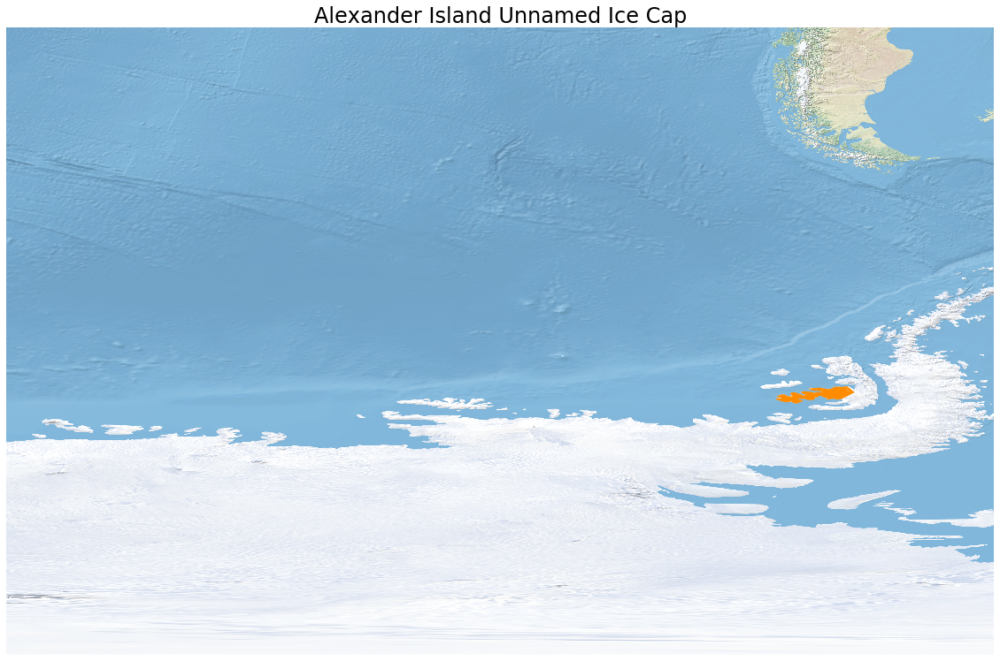

In [31]:
# Plot the new Alexander Ice Cap to see if it is correct
# Set up plot space
fig, ax = plt.subplots(figsize=(20, 20))
minx, miny, maxx, maxy = region_outline.total_bounds
maxx = -60
minx = -130
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

# Plot natural earth basemap for Region 7
ep.plot_rgb(ne_raster,
            rgb=[0, 1, 2],
            extent=ne_src_extent,
            ax=ax)

# Plot largest
alex_ex_ic_df.plot(ax=ax, color="darkorange")
ax.set_title('Alexander Island Unnamed Ice Cap', fontsize=24)
ax.set_axis_off()

plt.show()

In [32]:
# Write dataframe to shapefile and save to zip so I can review it in ArcMap
alex_zipfile_fn = "data/rgi/processed/ice-caps/exploded/region-" + region_number + "-alexander-island-clip.zip"
if os.path.exists(alex_zipfile_fn) == False:
    # Create the shapefile
    alex_data_fn = "data/rgi/processed/ice-caps/exploded/region-" + region_number + "-alexander-island-clip.shp"
    alex_ex_ic_df.to_file(driver='ESRI Shapefile', filename=alex_data_fn)
    
    # Zip up the shapefile
    alex_zipfile_fn = ws.zipshp(alex_data_fn, Delete=True)
    print("Creating zipfile: " + alex_zipfile_fn)
else:
    print(alex_zipfile_fn + " already extists")

data/rgi/processed/ice-caps/exploded/region-19-alexander-island-clip.zip already extists


### Set up ice cap dataframe

In [33]:
# Update and reorganize ice_caps_ex_df to create final df
# Drop uneeded columns
final_catchment_data_df = ice_caps_ex_df.drop(['id'], axis=1)

# Drop uneeded rows: first 1 and last 7 rows because only keeping thurston island and carney island ic
final_catchment_data_df.drop([0, 3, 4, 5, 6, 7, 8, 9], inplace = True)

# Add Alexander Island ice cap to dataframe and update its area measurement
final_catchment_data_df = final_catchment_data_df.append(alex_ex_ic_df.drop(['id'], axis=1))
final_catchment_data_df.iloc[2, final_catchment_data_df.columns.get_loc('area')] = round(alex_ex_area[0], 6)

# Add region_no column
final_catchment_data_df['region_no'] = region_number

# Add region_name column
final_catchment_data_df['reg_name'] = region_name

# Add primary class (primeclass) column. 
final_catchment_data_df['primeclass'] = [3, 3, 3]

# Sort the dataframe by largest to smallest ice cap
final_catchment_data_df = final_catchment_data_df.sort_values(by = "area", ascending = False)

# Add catchment names
final_catchment_data_df['ic_name'] = ['Alexander Island Unnamed Ice Cap', 'Thurston Island Ice Cap', 'Carney Island Ice Cap']

In [34]:
final_catchment_data_df

,area,geometry,region_no,reg_name,primeclass,ic_name
0,13024.475365,POLYGON ((-70.78388573978607 -71.8482696648381...,19,Antarctic and Subantarctic,3,Alexander Island Unnamed Ice Cap
1,11133.020929,POLYGON ((-96.38988303899998 -72.2732756079999...,19,Antarctic and Subantarctic,3,Thurston Island Ice Cap
2,6004.848151,"POLYGON ((-123.196889617 -73.88773663899997, -...",19,Antarctic and Subantarctic,3,Carney Island Ice Cap


## Get ice catchment measurement dates from a range of glacier outline dates.

Note that for Carney Ice Cap can just take the single date straight from the GLIMS database because it is aready the true outline of that ice cap.

In [35]:
# Open RGI shapefile with all of the glacier outlines
rgi_all_glaciers_df = ws.open_rgi_region(int(region_number))

In [36]:
rgi_all_glaciers_df.head()

,RGIId,GLIMSId,BgnDate,EndDate,CenLon,CenLat,O1Region,O2Region,Area,Zmin,...,Aspect,Lmax,Status,Connect,Form,TermType,Surging,Linkages,Name,geometry
0,RGI60-19.00001,G292519E66856S,19860218,20010219,-67.4810,-66.8560,19,20,64.608,10,...,209,8147,0,0,1,1,9,9,None,POLYGON ((-67.47734875399993 -66.8167791559999...
1,RGI60-19.00002,G295214E67651S,-9999999,-9999999,-64.7861,-67.6507,19,21,12.106,10,...,144,4898,0,0,1,5,9,9,None,POLYGON ((-64.76247626799994 -67.6349085259999...
2,RGI60-19.00003,G295108E67657S,-9999999,-9999999,-64.8917,-67.6569,19,21,13.364,30,...,95,2608,0,0,0,5,9,9,None,POLYGON ((-64.83270607399999 -67.6407185729999...
3,RGI60-19.00004,G295123E67636S,-9999999,-9999999,-64.8772,-67.6357,19,21,0.020,450,...,249,168,0,0,0,0,9,9,None,POLYGON ((-64.87921855999997 -67.6358341819999...
4,RGI60-19.00005,G295065E67628S,-9999999,-9999999,-64.9350,-67.6281,19,21,21.853,50,...,218,3655,0,0,1,5,9,9,None,POLYGON ((-64.85635701899997 -67.6297474679999...


In [37]:
# RGI Carney Ice Cap outline doesn't have a date but GLIMS does and it's the same size so use GLIMS date
# Use the date from GLIMS for the Carney Island date (since they have the same area, it's likely they came from
# the same data source at the same time)
# Open original cleaned GLIMS region 19 file
glims_cleaned_fn = "data/glims/processed/cleaned/glims_region_" + region_number + "_cleaned.shp"
glims_cleaned_df = gpd.read_file(glims_cleaned_fn)
ci_glims_id = 'G238773E74044S'
ci_glims_record = glims_cleaned_df[glims_cleaned_df['glac_id']==ci_glims_id]
ci_glims_record.reset_index(drop=True, inplace=True)
ci_date = ci_glims_record['src_date'][0]

In [38]:
# Get glaciers on Alexander Island Ice Cap
alex_ic_mask = ws.pip(rgi_all_glaciers_df, alex_ex_ic_df.reset_index(drop=True))
alex_glaciers = rgi_all_glaciers_df.loc[alex_ic_mask]
alex_glaciers.reset_index(drop=True, inplace=True)

# Print the minimum date and the maximum date
alex_glaciers_min_date = alex_glaciers['BgnDate'].min()
alex_glaciers_max_date = alex_glaciers['BgnDate'].max()
# Format date by adding hyphens
alex_glaciers_min_date = '-'.join([alex_glaciers_min_date[:4], alex_glaciers_min_date[4:6], alex_glaciers_min_date[6:]])
alex_glaciers_max_date = '-'.join([alex_glaciers_max_date[:4], alex_glaciers_max_date[4:6], alex_glaciers_max_date[6:]])
print('alex start date: ' + alex_glaciers_min_date)
print('alex end date: ' + alex_glaciers_max_date)
print('')

# Get all rgi and glims ids that make up the alexander ice catchment
ale_rgi_ids = alex_glaciers['RGIId']
ale_glims_ids = alex_glaciers['GLIMSId']
for i in range(len(ale_rgi_ids)):
    if i == 0:
        all_ale_rgi_ids = ale_rgi_ids[i]
        all_ale_glims_ids = ale_glims_ids[i]
    else:
        all_ale_rgi_ids = all_ale_rgi_ids + ', ' + ale_rgi_ids[i]
        all_ale_glims_ids = all_ale_glims_ids + ', ' + ale_glims_ids[i]

# Get glaciers on Thurston Island Ice Cap
thurs_ic_mask = ws.pip(rgi_all_glaciers_df, ice_caps_ex_df.iloc[1:2].reset_index(drop=True))
thurs_glaciers = rgi_all_glaciers_df.loc[thurs_ic_mask]
thurs_glaciers.reset_index(drop=True, inplace=True)

# Print the minimum date and the maximum date
thurs_glaciers_min_date = thurs_glaciers['BgnDate'].min()
thurs_glaciers_max_date = thurs_glaciers['BgnDate'].max()
# Format date by adding hyphens
thurs_glaciers_min_date = '-'.join([thurs_glaciers_min_date[:4], thurs_glaciers_min_date[4:6], thurs_glaciers_min_date[6:]])
thurs_glaciers_max_date = '-'.join([thurs_glaciers_max_date[:4], thurs_glaciers_max_date[4:6], thurs_glaciers_max_date[6:]])
print('thurston start date: ' + thurs_glaciers_min_date)
print('thurston end date: ' + thurs_glaciers_max_date)
print('')

# Get all rgi and glims ids that make up the alexander ice catchment
thu_rgi_ids = thurs_glaciers['RGIId']
thu_glims_ids = thurs_glaciers['GLIMSId']
for i in range(len(thu_rgi_ids)):
    if i == 0:
        all_thu_rgi_ids = thu_rgi_ids[i]
        all_thu_glims_ids = thu_glims_ids[i]
    else:
        all_thu_rgi_ids = all_thu_rgi_ids + ', ' + thu_rgi_ids[i]
        all_thu_glims_ids = all_thu_glims_ids + ', ' + thu_glims_ids[i]

# Set the min and max date for Carney IC from the GLIMS largest database value
carney_glaciers_min_date = ci_date[0:10]
carney_glaciers_max_date = ci_date[0:10]
print('carney start date: ' + carney_glaciers_min_date)
print('carney end date: ' + carney_glaciers_max_date)
print('')

# Get the RGI and GLIMS IDs from the RGI glaciers dataframe because it was a full outline and didn't need to be merged
all_car_rgi_ids = rgi_glaciers_df['RGIId'][0]
all_car_glims_ids = rgi_glaciers_df['GLIMSId'][0]

alex start date: 1990-01-27
alex end date: 2001-12-20

thurston start date: 1972-12-04
thurston end date: 1972-12-04

carney start date: 1956-02-01
carney end date: 1956-02-01



In [39]:
# Add the dates to the dataframe
final_catchment_data_df['min_date'] = [alex_glaciers_min_date, thurs_glaciers_min_date, carney_glaciers_min_date]

final_catchment_data_df['max_date'] = [alex_glaciers_max_date, thurs_glaciers_max_date, carney_glaciers_max_date]

# Add the RGI IDS
final_catchment_data_df['rgi_ids'] = [all_ale_rgi_ids, all_thu_rgi_ids, all_car_rgi_ids]

# Add the GLIMS IDS
final_catchment_data_df['glims_ids'] = [all_ale_glims_ids, all_thu_glims_ids, all_car_glims_ids]

# Reorder the columns
final_catchment_data_df = final_catchment_data_df[['region_no', 'reg_name', 'ic_name', 'primeclass', 'area', 
                                                   'min_date', 'max_date', 'rgi_ids', 'glims_ids', 'geometry']]

# Rename the area column
final_catchment_data_df.rename(columns={'area': 'area_km2'}, inplace=True)
                                     
# Reset index
final_catchment_data_df = final_catchment_data_df.reset_index(drop=True)

In [40]:
final_catchment_data_df

,region_no,reg_name,ic_name,primeclass,area_km2,min_date,max_date,rgi_ids,glims_ids,geometry
0,19,Antarctic and Subantarctic,Alexander Island Unnamed Ice Cap,3,13024.475365,1990-01-27,2001-12-20,"RGI60-19.00134, RGI60-19.00136, RGI60-19.00137...","G288531E71248S, G288390E71668S, G287038E71421S...",POLYGON ((-70.78388573978607 -71.8482696648381...
1,19,Antarctic and Subantarctic,Thurston Island Ice Cap,3,11133.020929,1972-12-04,1972-12-04,"RGI60-19.00419, RGI60-19.00420, RGI60-19.00421...","G264023E72179S, G259732E72072S, G263200E72031S...",POLYGON ((-96.38988303899998 -72.2732756079999...
2,19,Antarctic and Subantarctic,Carney Island Ice Cap,3,6004.848151,1956-02-01,1956-02-01,RGI60-19.01721,G238773E74044S,"POLYGON ((-123.196889617 -73.88773663899997, -..."


### Plot the final catchment dataframe to verify it looks correct

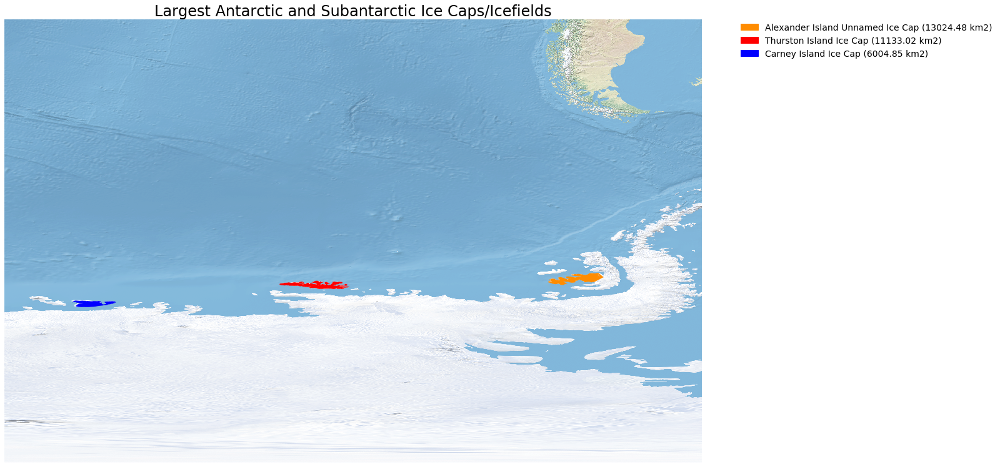

In [41]:
# Plot this regions ice caps in one frame
# Set up legend
legend_colors = ['darkorange', 'red', 'blue']
legend_labels = [final_catchment_data_df['ic_name'][0] + \
                 ' (' + str(round(final_catchment_data_df['area_km2'][0], 2)) + ' km2)', 
                 final_catchment_data_df['ic_name'][1] + \
                 ' (' + str(round(final_catchment_data_df['area_km2'][1], 2)) + ' km2)', 
                 final_catchment_data_df['ic_name'][2] + \
                 ' (' + str(round(final_catchment_data_df['area_km2'][2], 2)) + ' km2)']
legend_patches = [Patch(color=icolor, label=label)
                  for icolor, label in zip(legend_colors, legend_labels)]

# Set up plot space
fig, ax = plt.subplots(figsize=(20, 20))
minx, miny, maxx, maxy = region_outline.total_bounds
maxx = -60
minx = -130
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

# Plot natural earth basemap for Region 7
ep.plot_rgb(ne_raster,
            rgb=[0, 1, 2],
            extent=ne_src_extent,
            ax=ax)

# Plot largest
final_catchment_data_df.iloc[0:1].plot(ax=ax, color="darkorange")
final_catchment_data_df.iloc[1:2].plot(ax=ax, color="red")
final_catchment_data_df.iloc[2:3].plot(ax=ax, color="blue")
ax.set_title('Largest ' + region_name + ' Ice Caps/Icefields', fontsize=24)
ax.set_axis_off()

# Add legend
ax.legend(handles=legend_patches,
         facecolor ="white",
         edgecolor = "white",
         fontsize = 14,
         bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()

### Save final catchment dataframe to a shapefile

In [42]:
# Write dataframe to shapefile and save to zip if it doesn't already exist
catchment_zipfile_fn = "data/final-dataset/region-" + region_number + "-largest-complexes.zip"
if os.path.exists(catchment_zipfile_fn) == False:
    # Create the shapefile
    final_catchment_data_fn = "data/final-dataset/region-" + region_number + "-largest-complexes.shp"
    final_catchment_data_df.to_file(driver='ESRI Shapefile', filename=final_catchment_data_fn)
    
    # Zip up the shapefile
    catchment_zipfile_fn = ws.zipshp(final_catchment_data_fn, Delete=True)
    print("Creating zipfile: " + catchment_zipfile_fn)
else:
    print(catchment_zipfile_fn + " already extists")

Creating zipfile: data/final-dataset\region-19-largest-complexes.zip


### Antartic Pensula Ice Cap

In the literature this is generally called an ice sheet but analyzing it for completeness. This will not be part of the final data set.

In [43]:
# Open this regions ice caps from the exploded version
ml_ice_caps_ex_fn = "data/glims/processed/ice-caps/largest/largest-ice-caps-region_" + \
                  region_number + "_ESRI" + ic_epsg + ".shp"
ml_ice_caps_ex_df = gpd.read_file(ml_ice_caps_ex_fn)

In [44]:
ml_ice_caps_ex_df

,id,area,geometry
0,95,80852.069155,"POLYGON ((-65.016774 -67.351969, -65.027069 -6..."
1,18,3864.946465,"POLYGON ((-68.57106 -67.734026, -68.572852 -67..."
2,93,2063.249414,"POLYGON ((-63.555302 -64.754957, -63.555196 -6..."
3,79,1890.558057,"POLYGON ((-57.920545 -64.434573, -57.920224 -6..."
4,56,1447.563628,"POLYGON ((-55.79877 -63.318562, -55.797806 -63..."
5,78,889.365374,"POLYGON ((-62.618263 -64.513104, -62.617864 -6..."
6,94,488.327679,"POLYGON ((-66.180396 -65.86988700000001, -66.1..."
7,55,415.023892,"POLYGON ((-56.311064 -63.188244, -56.311133 -6..."
8,58,346.940747,"POLYGON ((-56.031213 -63.564608, -56.030237 -6..."
9,13,328.224534,"POLYGON ((-67.53216500000001 -67.782842, -67.5..."


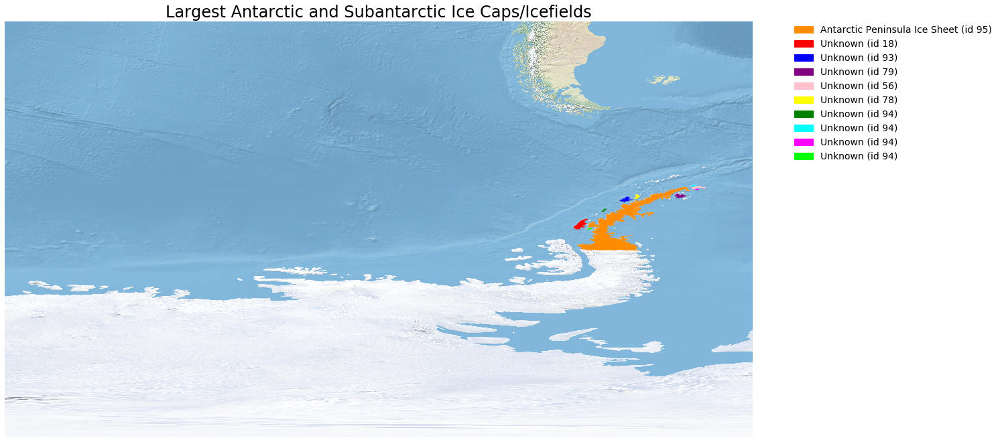

In [45]:
# Plot this regions ice caps in one frame
# Set up legend
legend_colors = ['darkorange', 'red', 'blue', 'purple', 'pink', 'yellow', 'green', 'cyan', 'magenta', 'lime']
legend_labels = ['Antarctic Peninsula Ice Sheet (id ' + str(ml_ice_caps_ex_df['id'][0]) + ')',
                 'Unknown (id ' + str(ml_ice_caps_ex_df['id'][1]) + ')', 
                 'Unknown (id ' + str(ml_ice_caps_ex_df['id'][2]) + ')', 
                 'Unknown (id ' + str(ml_ice_caps_ex_df['id'][3]) + ')',
                 'Unknown (id ' + str(ml_ice_caps_ex_df['id'][4]) + ')',
                 'Unknown (id ' + str(ml_ice_caps_ex_df['id'][5]) + ')', 
                 'Unknown (id ' + str(ml_ice_caps_ex_df['id'][6]) + ')', 
                 'Unknown (id ' + str(ml_ice_caps_ex_df['id'][6]) + ')',
                 'Unknown (id ' + str(ml_ice_caps_ex_df['id'][6]) + ')',
                 'Unknown (id ' + str(ml_ice_caps_ex_df['id'][6]) + ')']
legend_patches = [Patch(color=icolor, label=label)
                  for icolor, label in zip(legend_colors, legend_labels)]

# Set up plot space
fig, ax = plt.subplots(figsize=(20, 20))
minx, miny, maxx, maxy = region_outline.total_bounds
maxx = -50
minx = -130
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

# Plot natural earth basemap for Region 7
ep.plot_rgb(ne_raster,
            rgb=[0, 1, 2],
            extent=ne_src_extent,
            ax=ax)

# Plot largest
ml_ice_caps_ex_df.iloc[0:1].plot(ax=ax, color="darkorange")
ml_ice_caps_ex_df.iloc[1:2].plot(ax=ax, color="red")
ml_ice_caps_ex_df.iloc[2:3].plot(ax=ax, color="blue")
ml_ice_caps_ex_df.iloc[3:4].plot(ax=ax, color="purple")
ml_ice_caps_ex_df.iloc[4:5].plot(ax=ax, color="pink")
ml_ice_caps_ex_df.iloc[5:6].plot(ax=ax, color="yellow")
ml_ice_caps_ex_df.iloc[6:7].plot(ax=ax, color="green")
ml_ice_caps_ex_df.iloc[7:8].plot(ax=ax, color="cyan")
ml_ice_caps_ex_df.iloc[8:9].plot(ax=ax, color="magenta")
ml_ice_caps_ex_df.iloc[9:10].plot(ax=ax, color="lime")
ax.set_title('Largest ' + region_name + ' Ice Caps/Icefields', fontsize=24)
ax.set_axis_off()

# Add legend
ax.legend(handles=legend_patches,
         facecolor ="white",
         edgecolor = "white",
         fontsize = 14,
         bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

plt.show()

Old notes

RGI doesn't have many of the glaciers that are listed in GLIMS. The largest in GLIMS (Seller Glacier) is an example. The 1st largest and 2nd largest of RGI match the 2nd largest and 3rd largest of GLIMS. I will go with the top three in GLIMS. However, a newer versoin of GLIMS has added Pine Island Glacier which is MASSIVE (165,079 km2). After talking with Michael, he says, "Pine Island Glacier is an outlet glacier of the Ant. Ice Sheet and, hence, is not to be included in our list of the largest glaciers because it is not distinct from the ice sheet (conntectivity level 2)." Just like Greenland, we are only interested in connectvity levels 1 and 2.

Also, the 2nd largest "glacier" has the name of Carney Island Ice Cap. Should I include that one or skip it?